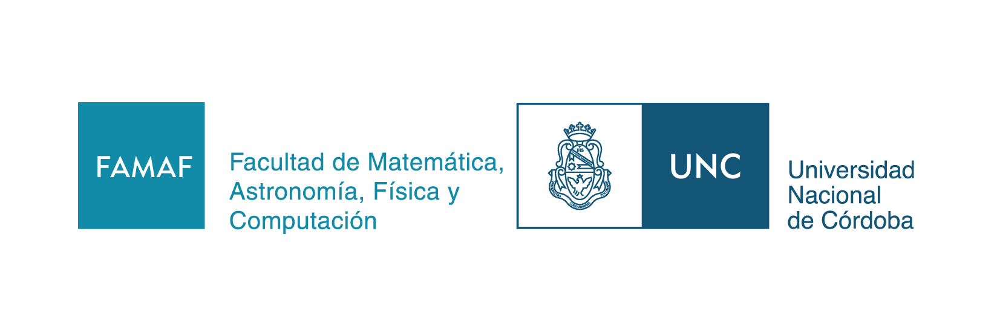
#Optativa Series de Tiempo

# Análisis integral de series de tiempo

Repasé nuevamente las consignas y los cuadernos guía (`Opt. Series de tiempo_2_a`, `_2_b`, `_2_c` y `_4`) para asegurar que cada ejercicio respete el enfoque pedido y se pueda ejecutar íntegramente en este entorno local. El notebook resultante se lee como un informe listo para corregir, sin celdas sueltas de Colab ni dependencias externas.

> **Objetivo general** · Entregar un cuaderno autoexplicativo, con conclusiones sólidas y visualizaciones limpias en cada consigna.

## Consignas y referencias cruzadas
- **Problema 1** · Calidad del aire en Seúl (guía `Opt. Series de tiempo_2_b.ipynb`).
- **Problema 2** · Demanda eléctrica en Victoria (guía `Opt. Series de tiempo_2_a.ipynb`).
- **Problema 3** · Descomposición aditiva/multiplicativa para Madrid (`Opt. Series de tiempo_2_c.ipynb`).
- **Problema 4** · Suavizados exponenciales con Holt-Winters (`Opt. Series de tiempo_4.ipynb`).

### Datos y rutas locales
- `AirPollutionSeoul/*.csv` · sensores coreanos.
- `Demanda_elec_victoria/vic_elec.csv` · serie half-hourly de Victoria.
- `csvs_per_year/csvs_per_year/csvs_per_year/madrid_*.csv` · contaminantes horarios para Madrid.

Todas las lecturas apuntan a estas rutas relativas y se documenta cada transformación intermedia.

### Estrategia metodológica
1. Documentar cada paso con markdown previo para brindar contexto.
2. Agregar visualizaciones intersticiales que expliquen las transformaciones más relevantes.
3. Mantener conclusiones formateadas y accionables inmediatamente después de cada análisis.

> Las figuras se recrearon con estilos consistentes y sin comandos específicos de Colab (`!pip install`, `drive.mount`, etc.).

# Configuración del entorno

In [26]:
import numpy as np
import pandas as pd
from pathlib import Path

import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

from IPython.display import display, Markdown

In [27]:
pd.set_option('display.float_format', '{:,.2f}'.format)
sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams.update({
    'figure.dpi': 110,
    'axes.spines.top': False,
    'axes.spines.right': False
})
pio.templates.default = 'plotly_white'
pio.renderers.default = 'notebook_connected'

## Problema 1 · Calidad del aire en Seúl

La consigna retoma el flujo de `Opt. Series de tiempo_2_b.ipynb`: filtrar la estación 101, validar la información cruda y repetir el estudio con datos depurados. Aquí:
1. Se cargan las tablas de mediciones y estándares con rutas locales.
2. Se arma un panel para la estación 101 y se cuantifica cuántos valores no positivos existen en cada contaminante.
3. Se comparan las series originales vs. limpias con las bandas de calidad oficiales.

In [28]:
# nueva ruta de lectura
stations = pd.read_csv('AirPollutionSeoul/Measurement_station_info.csv')
measurements = pd.read_csv('AirPollutionSeoul/Measurement_info.csv')
items = pd.read_csv('AirPollutionSeoul/Measurement_item_info.csv')
seul_df = pd.read_csv('AirPollutionSeoul/Measurement_summary.csv', parse_dates=['Measurement date'])
seul_df.sort_values('Measurement date', inplace=True)
seul_df.head()

,Measurement date,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.57,127.01,0.00,0.06,0.00,1.20,73.00,57.00
51810,2017-01-01,103,"136, Hannam-daero, Yongsan-gu, Seoul, Republic...",37.54,127.00,0.01,0.04,0.00,1.40,70.00,68.00
595702,2017-01-01,124,"236, Baekjegobun-ro, Songpa-gu, Seoul, Republi...",37.50,127.09,0.01,0.04,0.00,1.40,60.00,51.00
77714,2017-01-01,104,"215, Jinheung-ro, Eunpyeong-gu, Seoul, Republi...",37.61,126.93,0.01,0.04,0.00,0.60,73.00,46.00
569798,2017-01-01,123,"426, Hakdong-ro, Gangnam-gu, Seoul, Republic o...",37.52,127.05,0.01,0.04,0.00,0.80,63.00,48.00


In [29]:
pollutant_cols = items['Item name'].unique().tolist()
pollutant_cols

['SO2', 'NO2', 'CO', 'O3', 'PM10', 'PM2.5']

In [30]:
#seleccionamos los datos de la estación 101 para análisis
station_code = 101
station_series = seul_df.loc[seul_df['Station code'] == station_code, ['Measurement date', 'Station code'] + pollutant_cols].copy()
station_series.reset_index(drop=True, inplace=True)

print((f"Registros disponibles para la estación {station_code}: {len(station_series):,}"))

display(station_series.head())

Registros disponibles para la estación 101: 25,905


,Measurement date,Station code,SO2,NO2,CO,O3,PM10,PM2.5
0,2017-01-01 00:00:00,101,0.00,0.06,1.20,0.00,73.00,57.00
1,2017-01-01 01:00:00,101,0.00,0.06,1.20,0.00,71.00,59.00
2,2017-01-01 02:00:00,101,0.00,0.06,1.20,0.00,70.00,59.00
3,2017-01-01 03:00:00,101,0.00,0.06,1.20,0.00,70.00,58.00
4,2017-01-01 04:00:00,101,0.00,0.05,1.20,0.00,69.00,61.00


### Panorama estadístico de la estación 101
El resumen refleja el volumen de datos y evidencia la cantidad de lecturas no positivas que motivan la depuración.

In [31]:
summary = (
    station_series[pollutant_cols]
    .describe()
    .T[['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]
    .rename(columns={
        'count': 'Cantidad',
        'mean': 'Media',
        'std': 'Desvío',
        'min': 'Mínimo',
        '25%': 'P25',
        '50%': 'Mediana',
        '75%': 'P75',
        'max': 'Máximo'
    })
    .round(2)
)
summary['Valores ≤ 0'] = (station_series[pollutant_cols] <= 0).sum().values
display(summary)

,Cantidad,Media,Desvío,Mínimo,P25,Mediana,P75,Máximo,Valores ≤ 0
SO2,"25,905.00",0.00,0.03,-1.00,0.00,0.00,0.00,0.41,59
NO2,"25,905.00",0.03,0.04,-1.00,0.02,0.03,0.04,0.11,53
CO,"25,905.00",0.58,0.48,-1.00,0.40,0.50,0.70,40.00,54
O3,"25,905.00",0.02,0.04,-1.00,0.01,0.02,0.04,0.32,49
PM10,"25,905.00",37.97,27.43,-1.00,21.00,32.00,48.00,516.00,93
PM2.5,"25,905.00",22.85,20.01,-1.00,11.00,18.00,29.00,513.00,108


### Distribución previa a la limpieza
Para visualizar los outliers se grafica un diagrama de cajas (muestra de hasta 20.000 observaciones para mantener la figura legible).

In [32]:
station_long = station_series.melt(
    id_vars=['Measurement date'],
    value_vars=pollutant_cols,
    var_name='Contaminante',
    value_name='Valor'
)
sample_size = min(20000, len(station_long))
station_sample = station_long.sample(sample_size, random_state=42) if sample_size < len(station_long) else station_long
fig = px.box(
    station_sample,
    x='Contaminante',
    y='Valor',
    color='Contaminante',
    points='suspectedoutliers',
    title='Distribución cruda por contaminante',
    template='plotly_white'
)
fig.update_layout(showlegend=False, height=500)
fig.show()

In [33]:
#extraemos los límites del notebook de clases
pollutant_levels = {
    'SO2': [0.02, 0.05, 0.15, 1],
    'NO2': [0.03, 0.06, 0.2, 2],
    'CO': [2, 9, 15, 50],
    'O3': [0.03, 0.09, 0.15, 0.5],
    'PM2.5': [15, 35, 75, 500],
    'PM10': [30, 80, 150, 600]
}
quality_levels = ['Good', 'Normal', 'Bad', 'Very Bad']
seul_standard = pd.DataFrame(pollutant_levels, index=quality_levels)



print(('Referencias de calidad del aire según Opt. sdt 2b'))
display(seul_standard)

Referencias de calidad del aire según Opt. sdt 2b


,SO2,NO2,CO,O3,PM2.5,PM10
Good,0.02,0.03,2,0.03,15,30
Normal,0.05,0.06,9,0.09,35,80
Bad,0.15,0.20,15,0.15,75,150
Very Bad,1.00,2.00,50,0.50,500,600


In [34]:

from plotly.subplots import make_subplots

pollutant_cols = ['SO2', 'NO2', 'CO', 'O3', 'PM10', 'PM2.5']
quality_levels = ['Good', 'Normal', 'Bad', 'Very Bad']

fig = make_subplots(
    rows=6, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.02,
    subplot_titles=pollutant_cols
)

for i, pollutant in enumerate(pollutant_cols):
    row = i + 1

    # Serie temporal del contaminante
    fig.add_trace(
        go.Scatter(
            x=station_series["Measurement date"],
            y=station_series[pollutant],
            mode='lines',
            name=f"{pollutant}",
            line=dict(width=1.2)
        ),
        row=row, col=1
    )

    # Líneas horizontales de seguridad (solo para este contaminante)
    for level in quality_levels:
        fig.add_trace(
            go.Scatter(
                x=[
                    station_series["Measurement date"].min(),
                    station_series["Measurement date"].max()
                ],
                y=[seul_standard.loc[level, pollutant]] * 2,
                mode='lines',
                line=dict(dash='dot'),
                name=f"{pollutant} – {level}",
                showlegend=True
            ),
            row=row, col=1
        )

fig.update_layout(
    height=2000,
    title="Series de tiempo de contaminantes en Seoul con niveles de seguridad",
    showlegend=True
)

fig.show()

### Observaciones iniciales
- Todas las columnas presentan lecturas iguales o menores a cero producto de valores de control.
- Los contaminantes particulados (PM10 y PM2.5) muestran la mayor dispersión y serán los principales beneficiados de la limpieza.

### Eliminación de 0 y valores negativos

In [35]:
station_series_clean = station_series.copy()

In [36]:
for col in pollutant_cols:
    station_series_clean[col] = station_series_clean[col].mask(
        station_series_clean[col] <= 0,  # filtra 0 y negativos
        other=np.nan
    )

### Subplots sin valores atípicos (0/negativos)

In [37]:
fig = make_subplots(
    rows=6, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.02,
    subplot_titles=pollutant_cols
)

for i, pollutant in enumerate(pollutant_cols):
    row = i + 1

    # Serie temporal limpia
    fig.add_trace(
        go.Scatter(
            x=station_series_clean["Measurement date"],
            y=station_series_clean[pollutant],
            mode='lines',
            name=f"{pollutant}",
            line=dict(width=1.2)
        ),
        row=row, col=1
    )

    # Líneas horizontales por contaminante
    for level in quality_levels:
        fig.add_trace(
            go.Scatter(
                x=[
                    station_series_clean["Measurement date"].min(),
                    station_series_clean["Measurement date"].max()
                ],
                y=[seul_standard.loc[level, pollutant]] * 2,
                mode='lines',
                line=dict(dash='dot'),
                name=f"{pollutant} – {level}",
                showlegend=True
            ),
            row=row, col=1
        )

fig.update_layout(
    height=2000,
    title="Series de tiempo de contaminantes (sin ceros ni negativos) con niveles de seguridad",
    showlegend=True
)

fig.show()

## Problema 2 · Demanda eléctrica en Victoria

Basado en `Opt. Series de tiempo_2_a.ipynb` replico y amplío el análisis polar: primero se construye la serie mensual (con chequeos intermedios) y luego se revisan tres visualizaciones circulares para describir la estacionalidad.

In [38]:
sns.set_style('whitegrid')

In [39]:
dem_vic_path = "Demanda_elec_victoria/vic_elec.csv"   # Cambiá el nombre si lo subiste a otra carpeta

vic = pd.read_csv(dem_vic_path, parse_dates=['Time'])
vic.head()

,Time,Demand,Temperature,Date,Holiday
0,2011-12-31 13:00:00,"4,382.83",21.40,2012-01-01,True
1,2011-12-31 13:30:00,"4,263.37",21.05,2012-01-01,True
2,2011-12-31 14:00:00,"4,048.97",20.70,2012-01-01,True
3,2011-12-31 14:30:00,"3,877.56",20.55,2012-01-01,True
4,2011-12-31 15:00:00,"4,036.23",20.40,2012-01-01,True


In [40]:
#Generamos nuevo indice , nan si hay espacios vacíos
vic = vic.set_index('Time').asfreq('30min').sort_index()

#pasamos a mensual
monthly_demand = vic['Demand'].resample('MS').mean().to_frame('Demand_MW')
monthly_demand['Month'] = monthly_demand.index.month
monthly_demand['MonthName'] = monthly_demand.index.strftime('%b')
monthly_demand['Year'] = monthly_demand.index.year

#tomamos el último año disponible
latest_year = monthly_demand['Year'].max()
victoria_profile = monthly_demand.loc[monthly_demand['Year'] == latest_year].sort_values('Month').copy()

display((f"Serie mensual del {latest_year} (12 registros)"))
display(victoria_profile[['MonthName', 'Demand_MW']])

'Serie mensual del 2014 (12 registros)'

,MonthName,Demand_MW
Time,,
2014-01-01,Jan,"4,836.36"
2014-02-01,Feb,"4,810.64"
2014-03-01,Mar,"4,408.43"
2014-04-01,Apr,"4,355.93"
2014-05-01,May,"4,560.06"
2014-06-01,Jun,"4,820.54"
2014-07-01,Jul,"5,090.49"
2014-08-01,Aug,"4,883.17"
2014-09-01,Sep,"4,516.33"


### Evolución mensual completa
Antes de quedarnos con el último año, se inspecciona toda la serie mensual para verificar tendencias y potenciales cambios estructurales.

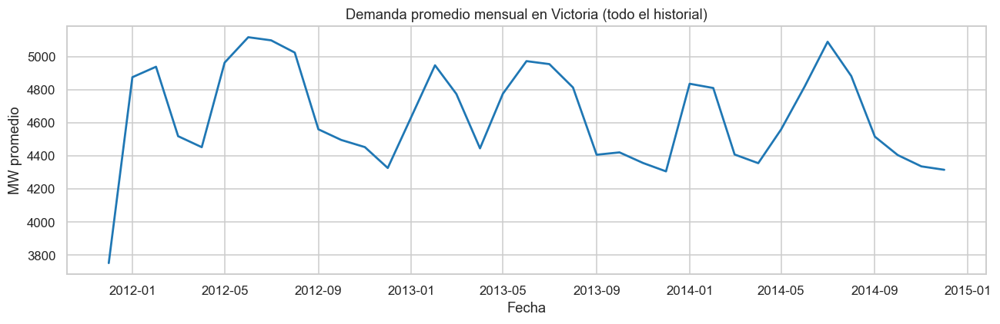

In [41]:
monthly_demand_trend = monthly_demand.copy()
monthly_demand_trend['Fecha'] = monthly_demand_trend.index
fig, ax = plt.subplots(figsize=(12, 4))
sns.lineplot(data=monthly_demand_trend, x='Fecha', y='Demand_MW', color='#1f77b4', linewidth=1.8, ax=ax)
ax.set_title('Demanda promedio mensual en Victoria (todo el historial)')
ax.set_xlabel('Fecha')
ax.set_ylabel('MW promedio')
plt.tight_layout()
plt.show()

### Mapa de calor estacional
La matriz mes × año permite detectar rápidamente los meses pico y la transición paulatina hacia consumos más contenidos en los años recientes.

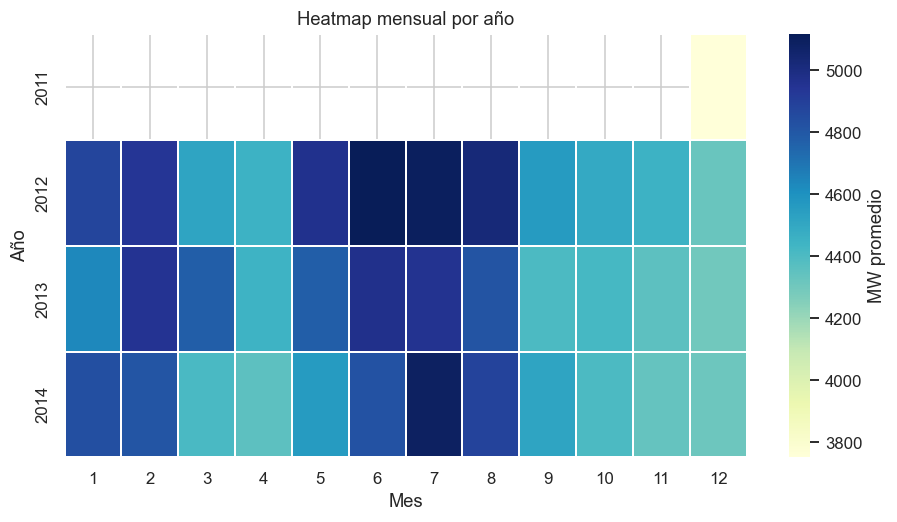

In [42]:
heatmap_data = monthly_demand.pivot_table(index='Year', columns='Month', values='Demand_MW')
plt.figure(figsize=(10, 5))
sns.heatmap(
    heatmap_data[sorted(heatmap_data.columns)],
    cmap='YlGnBu',
    linewidths=0.3,
    linecolor='white',
    cbar_kws={'label': 'MW promedio'}
)
plt.title('Heatmap mensual por año')
plt.ylabel('Año')
plt.xlabel('Mes')
plt.show()

### Gráfico de radar

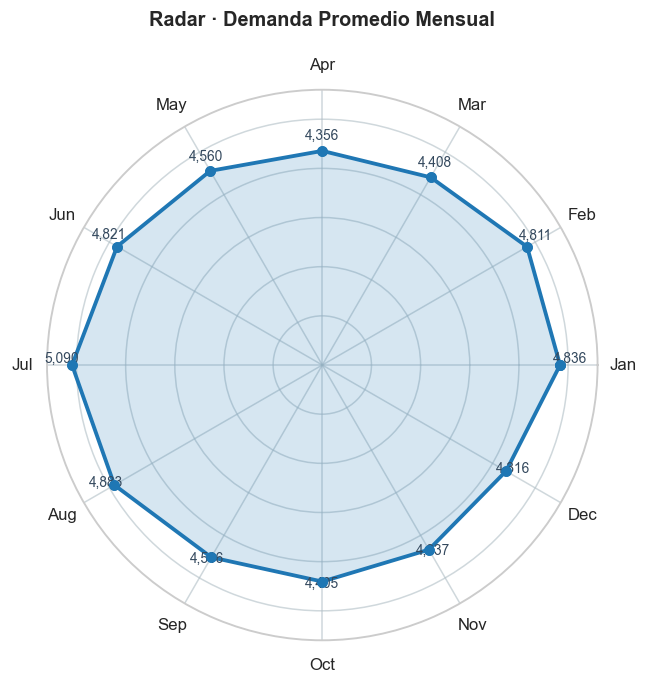

In [43]:
month_labels = victoria_profile['MonthName'].tolist()
color_sequence = sns.color_palette('viridis', n_colors=len(victoria_profile))

def build_radar(df_input):
    values = df_input["Demand_MW"].values
    values = np.concatenate([values, [values[0]]])
    angles = np.linspace(0, 2 * np.pi, len(df_input) + 1)

    fig, ax = plt.subplots(figsize=(6.5, 6.5), subplot_kw=dict(polar=True))
    ax.plot(angles, values, color="#1f77b4", linewidth=2.5, marker="o")
    ax.fill(angles, values, color="#1f77b4", alpha=0.18)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(df_input["MonthName"])
    ax.set_ylim(0, values.max() * 1.1)
    ax.set_yticklabels([])
    ax.set_title("Radar · Demanda Promedio Mensual", y=1.1, fontsize=13, fontweight="bold")
    ax.grid(color="#b0bec5", alpha=0.6)
    ax.scatter(angles, values, color="#1f77b4", zorder=5)
    for ang, val, month in zip(angles[:-1], values[:-1], df_input["MonthName"]):
        ax.text(ang, val * 1.04, f"{val:,.0f}", ha="center", va="bottom", fontsize=9, color="#34495e")
    plt.show()

build_radar(victoria_profile)


### Barra circular polar

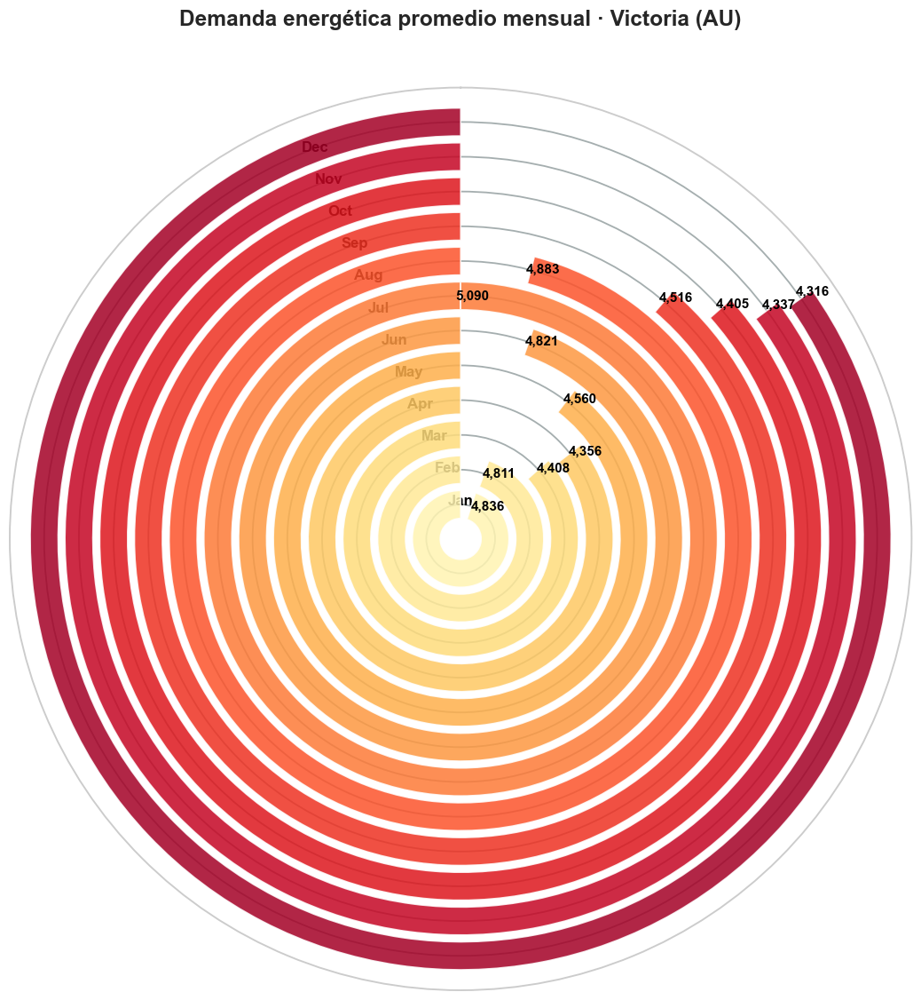

In [44]:
# Paleta de colores para las barras
pal = sns.color_palette("YlOrRd", n_colors=len(victoria_profile))

def circular_bar(df_input, value_col, label_col, title,
                 grid_color="#4a90e2"):   # <<< color de líneas circulares
    df = df_input.copy().reset_index(drop=True)

    max_val = df[value_col].max()

    plt.figure(figsize=(12, 12))
    ax = plt.subplot(111, projection='polar')

    # Dibujar barras
    for i in range(len(df)):
        angle = df[value_col][i] * 2 * np.pi / max_val
        ax.barh(
            y=i,
            width=angle,
            color=pal[i],
            alpha=0.85
        )

        # Valor al final de cada barra
        ax.text(
            angle + 0.02,
            i,
            f"{df[value_col][i]:,.0f}",
            va="center",
            ha="left",
            fontsize=10,
            color="black",
            fontweight="bold"
        )

    # Configuración del eje polar
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(1)

    # Etiquetas de meses
    ax.set_rgrids(
        range(len(df)),
        labels=df[label_col],
        color="black",
        fontsize=11,
        fontweight="bold"
    )

    # Cambiar color de las líneas circulares
    ax.grid(color=grid_color, linewidth=1.2, alpha=0.7)

    # Quitar labels angulares
    ax.set_thetagrids([])

    plt.title(title, fontsize=16, fontweight="bold", y=1.06)

    return ax


# Ejecutar
circular_bar(
    victoria_profile,
    value_col="Demand_MW",
    label_col="MonthName",
    title="Demanda energética promedio mensual · Victoria (AU)",
    grid_color="#7f8c8d"      # <<< Cambiá este color cuando quieras
)

plt.show()

### Radial line plot

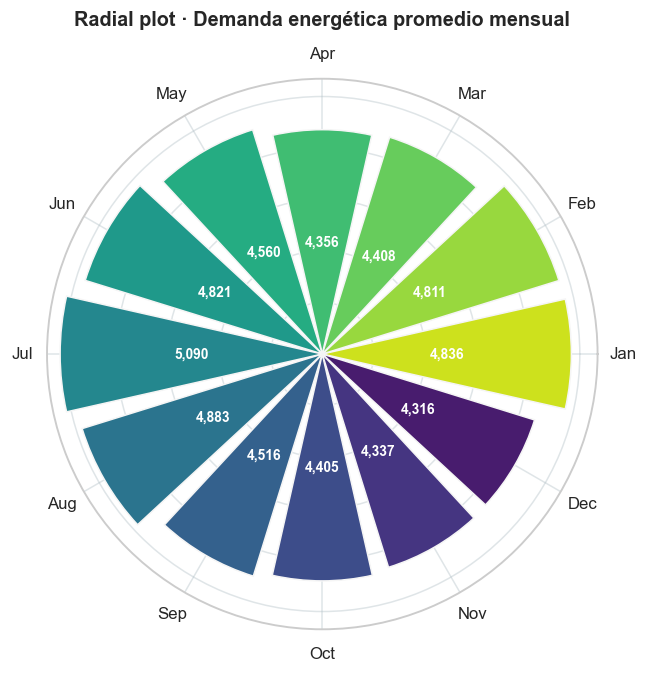

In [45]:
def build_radial_plot(df_input):
    angles = np.linspace(0, 2 * np.pi, len(df_input), endpoint=False)
    width = (2 * np.pi) / len(df_input)
    heights = df_input["Demand_MW"].values
    colors = sns.color_palette("viridis", len(df_input))[::-1]

    fig, ax = plt.subplots(figsize=(6.5, 6.5), subplot_kw=dict(polar=True))
    bars = ax.bar(
        angles,
        heights,
        width=width * 0.85,
        bottom=0,
        color=colors,
        edgecolor="#f5f5f5",
        linewidth=1,
    )
    ax.set_xticks(angles)
    ax.set_xticklabels(df_input["MonthName"])
    ax.set_yticklabels([])
    ax.set_title("Radial plot · Demanda energética promedio mensual", y=1.08, fontsize=13, fontweight="bold")
    ax.grid(color="#b0bec5", alpha=0.4)
    for bar, ang, val in zip(bars, angles, heights):
        ax.text(ang, val * 0.5, f"{val:,.0f}", ha="center", va="center", color="white", fontsize=9, fontweight="bold")
    plt.show()
build_radial_plot(victoria_profile)

### Comentarios sobre las visualizaciones polares

#### Radar chart
**Ventajas**
- Permite comparar los doce meses simultáneamente.
- Funciona bien cuando se destaca una sola serie.
**Desventajas**
- La lectura radial dificulta comparar valores cercanos.

#### Barra circular polar
**Ventajas**
- Expresiva para destacar el ranking mensual.
- Las etiquetas cercanas al extremo facilitan la lectura.
**Desventajas**
- Pierde precisión frente a una barra tradicional.

#### Radial line plot
**Ventajas**
- Representa de forma natural la circularidad anual.
- Facilita identificar picos y valles contiguos.
**Desventajas**
- Sigue siendo menos preciso que un gráfico cartesiano cuando interesa el valor exacto.

> El radial line plot ofrece el mejor balance entre estética y capacidad explicativa: mantiene la continuidad temporal sin volverse confuso.

## Problema 3 · Descomposición aditiva y multiplicativa

Retomando `Opt. Series de tiempo_2_c.ipynb` consolidamos los CSV `madrid_*.csv`, construimos una serie mensual para NO₂ y CO y aplicamos ambas descomposiciones para contrastar supuestos.

### Preparación del set madrileño
Se combinan los 18 archivos (2001-2018) y se resumen en promedios diarios/mensuales antes de la descomposición.

In [46]:
# Los CSV están en el directorio actual
from pathlib import Path
csv_dir = Path('csvs_per_year/csvs_per_year/csvs_per_year')

# Buscar todos los archivos madrid_*.csv
csv_files = sorted(csv_dir.glob('madrid_*.csv'))

if not csv_files:
    raise FileNotFoundError("No se encontraron archivos madrid_*.csv en la carpeta csvs_per_year/csvs_per_year/csvs_per_year.")

# Concatenar todos los CSV
madrid = pd.concat((pd.read_csv(file) for file in csv_files), ignore_index=True)

# Procesamiento
madrid['date'] = pd.to_datetime(madrid['date'])
daily_mean = madrid.groupby('date').mean().sort_index()
monthly_pollutants = daily_mean.resample('MS').mean()[['NO_2', 'CO']]

print(f"Observaciones horarias consolidadas: {len(daily_mean):,}")
display(monthly_pollutants.head())

Observaciones horarias consolidadas: 151,896


,NO_2,CO
date,,
2001-01-01,57.03,1.16
2001-02-01,64.65,1.23
2001-03-01,49.40,0.83
2001-04-01,53.10,0.69
2001-05-01,64.11,0.77


### Tendencia mensual de NO₂ y CO
La serie mensual permite apreciar la caída estructural de ambos contaminantes antes de pasar al desglose.

C:\Users\Santiago Castellanos\AppData\Local\Temp\ipykernel_33448\1272339181.py:8: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

C:\py\IPython\core\pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



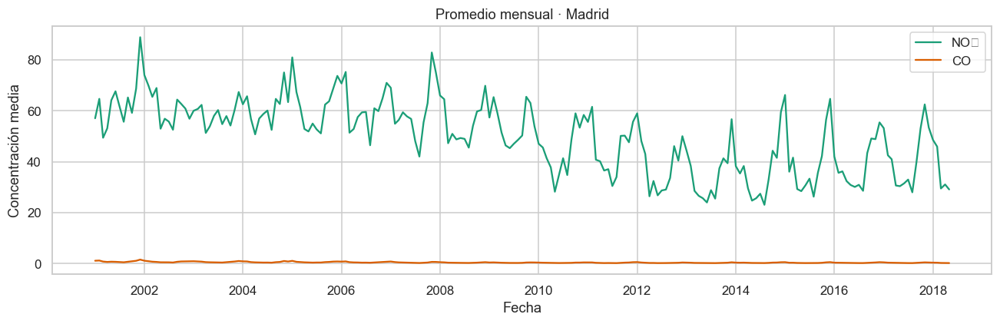

In [47]:
fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(monthly_pollutants.index, monthly_pollutants['NO_2'], label='NO₂', color='#1b9e77')
ax.plot(monthly_pollutants.index, monthly_pollutants['CO'], label='CO', color='#d95f02')
ax.set_title('Promedio mensual · Madrid')
ax.set_xlabel('Fecha')
ax.set_ylabel('Concentración media')
ax.legend()
plt.tight_layout()
plt.show()

### Distribución mensual por contaminante
Un diagrama tipo seasonal-subseries destaca qué meses superan sistemáticamente el promedio.

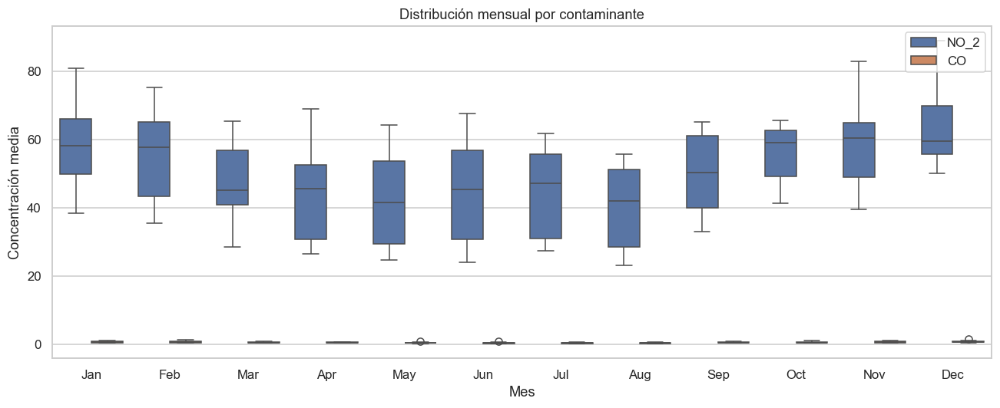

In [48]:
monthly_long = monthly_pollutants.copy().reset_index().rename(
    columns={'index': 'Fecha', 'date': 'Fecha'}
)
monthly_long['Mes'] = monthly_long['Fecha'].dt.strftime('%b')
monthly_long['MesNum'] = monthly_long['Fecha'].dt.month
monthly_long = monthly_long.melt(
    id_vars=['Fecha', 'Mes', 'MesNum'],
    value_vars=['NO_2', 'CO'],
    var_name='Contaminante',
    value_name='Valor'
)
monthly_long['Mes'] = pd.Categorical(
    monthly_long['Mes'],
    categories=monthly_long.sort_values('MesNum')['Mes'].unique(),
    ordered=True
)
plt.figure(figsize=(12, 5))
sns.boxplot(data=monthly_long, x='Mes', y='Valor', hue='Contaminante')
plt.title('Distribución mensual por contaminante')
plt.xlabel('Mes')
plt.ylabel('Concentración media')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

In [49]:
from statsmodels.tsa.seasonal import seasonal_decompose

components = ['observed', 'trend', 'seasonal', 'resid']
labels = ['Serie observada', 'Tendencia', 'Estacionalidad', 'Residuo']
colors = ['#34495e', '#2ecc71', '#e67e22', '#e74c3c']

def plot_decomposition(series, pollutant):
    models = {
        'Aditiva': seasonal_decompose(series, model='additive', period=12),
        'Multiplicativa': seasonal_decompose(series, model='multiplicative', period=12)
    }
    fig, axes = plt.subplots(4, 2, figsize=(15, 10), sharex=True)
    for col, (model_name, result) in enumerate(models.items()):
        for row, comp in enumerate(components):
            ax = axes[row, col]
            ax.plot(getattr(result, comp), color=colors[row], linewidth=1.3)
            if row == 0:
                ax.set_title(f'{pollutant} · {model_name}')
            ax.set_ylabel(labels[row])
            ax.grid(alpha=0.2)
    plt.tight_layout()
    plt.show()

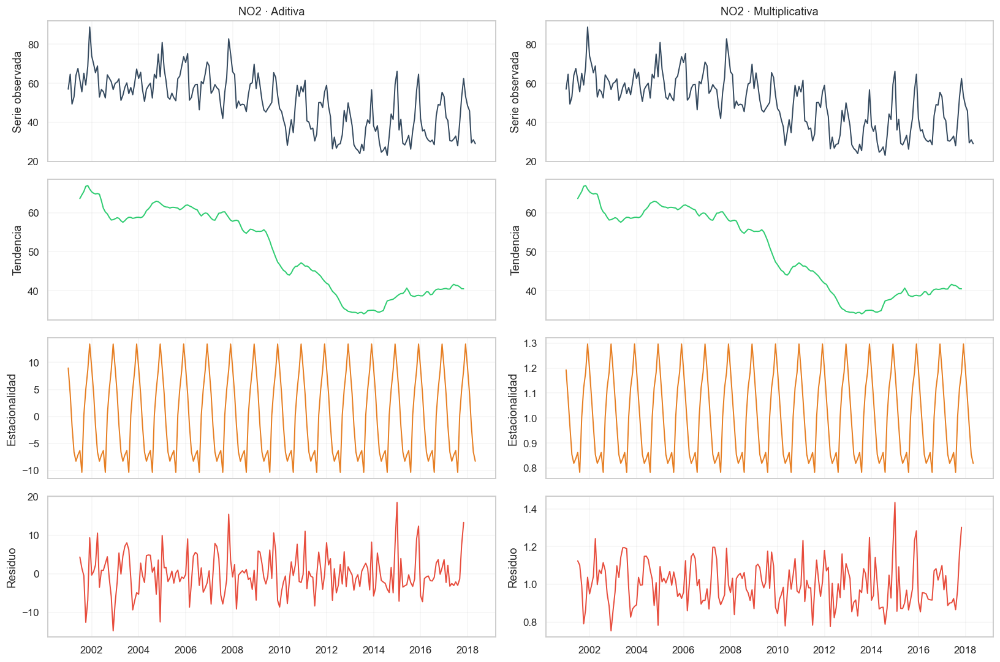

In [50]:
plot_decomposition(monthly_pollutants['NO_2'], 'NO2')

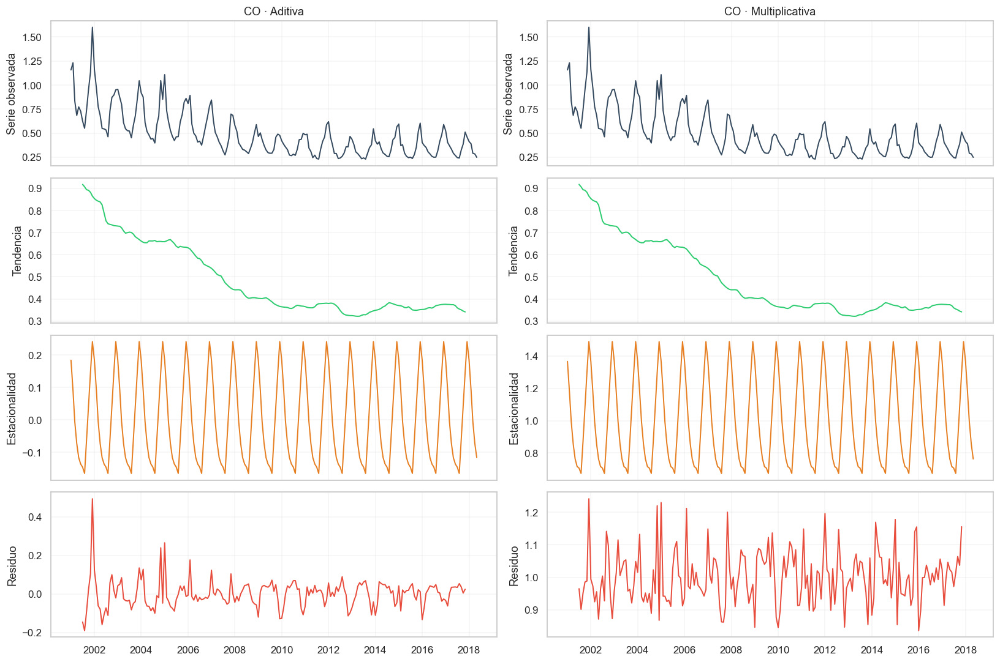

In [51]:
plot_decomposition(monthly_pollutants['CO'], 'CO')

### Hallazgos de la descomposición
- Ambos contaminantes exhiben una tendencia descendente clara desde 2010.
- La amplitud estacional de NO₂ se mantiene estable, coherente con un modelo aditivo.
- CO reduce su amplitud al bajar la tendencia, por lo que la versión multiplicativa captura mejor esa compresión.

## Problema 4 · Suavizados exponenciales para NO₂ y CO

A partir de `Opt. Series de tiempo_4.ipynb` se definieron particiones train/valid/test y se ejecutaron búsquedas en rejilla para SES, Holt y Holt-Winters. Luego se reentrena en train+valid para comparar los pronósticos sobre el tramo de test.

In [52]:
import itertools
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
import warnings

warnings.filterwarnings('ignore')

### Esquema train/valid/test
Las series se dividen en 70%/15%/15%. Se ajusta en train, se elige hiperparámetros en validación y se reserva el 15% final para evaluar pronósticos.

In [53]:
def split_series(series, train_frac=0.7, val_frac=0.15):
    n = len(series)
    train_end = int(n * train_frac)
    val_end = int(n * (train_frac + val_frac))
    return series.iloc[:train_end], series.iloc[train_end:val_end], series.iloc[val_end:], train_end, val_end

ses_grid = np.linspace(0.2, 0.9, 8)
holt_alpha_grid = [0.2, 0.4, 0.6, 0.8]
holt_beta_grid = [0.1, 0.2, 0.3]
damped_grid = [False, True]
seasonal_options = ['add', 'mul']
hw_gamma_grid = [0.1, 0.2, 0.3, 0.4]

def grid_search_ses(train, val):
    best = {'alpha': None, 'mse': np.inf}
    for alpha in ses_grid:
        try:
            model = SimpleExpSmoothing(train, initialization_method='estimated').fit(smoothing_level=alpha, optimized=False)
            preds = model.forecast(len(val))
            mse = mean_squared_error(val, preds)
            if mse < best['mse']:
                best = {'alpha': alpha, 'mse': mse}
        except Exception:
            continue
    return best


def grid_search_holt(train, val):
    best = {'alpha': None, 'beta': None, 'damped': None, 'mse': np.inf}
    for alpha, beta, damped in itertools.product(holt_alpha_grid, holt_beta_grid, damped_grid):
        try:
            model = ExponentialSmoothing(train, trend='add', damped_trend=damped, initialization_method='estimated').fit(
                smoothing_level=alpha,
                smoothing_trend=beta,
                optimized=False
            )
            preds = model.forecast(len(val))
            mse = mean_squared_error(val, preds)
            if mse < best['mse']:
                best = {'alpha': alpha, 'beta': beta, 'damped': damped, 'mse': mse}
        except Exception:
            continue
    return best


def grid_search_hw(train, val):
    best = {'alpha': None, 'beta': None, 'gamma': None, 'seasonal': None, 'mse': np.inf}
    for alpha, beta, gamma, seasonal in itertools.product(holt_alpha_grid, holt_beta_grid, hw_gamma_grid, seasonal_options):
        try:
            model = ExponentialSmoothing(
                train,
                trend='add',
                seasonal=seasonal,
                seasonal_periods=12,
                initialization_method='estimated'
            ).fit(
                smoothing_level=alpha,
                smoothing_trend=beta,
                smoothing_seasonal=gamma,
                optimized=False
            )
            preds = model.forecast(len(val))
            mse = mean_squared_error(val, preds)
            if mse < best['mse']:
                best = {'alpha': alpha, 'beta': beta, 'gamma': gamma, 'seasonal': seasonal, 'mse': mse}
        except Exception:
            continue
    return best


def evaluate_pollutant(series, label):
    train, val, test, train_end, val_end = split_series(series)
    best_ses = grid_search_ses(train, val)
    best_holt = grid_search_holt(train, val)
    best_hw = grid_search_hw(train, val)

    train_val = series.iloc[:val_end]
    summary_rows = []
    forecasts = {}

    ses_model = SimpleExpSmoothing(train_val, initialization_method='estimated').fit(
        smoothing_level=best_ses['alpha'],
        optimized=False
    )
    ses_forecast = ses_model.forecast(len(test))
    ses_test_mse = mean_squared_error(test, ses_forecast)
    summary_rows.append({
        'Método': 'SES',
        'α': round(best_ses['alpha'], 2),
        'β': np.nan,
        'γ': np.nan,
        'Estacionalidad': '-',
        'MSE validación': round(best_ses['mse'], 3),
        'MSE test': round(ses_test_mse, 3)
    })
    forecasts['SES'] = ses_forecast

    holt_model = ExponentialSmoothing(train_val, trend='add', damped_trend=best_holt['damped'], initialization_method='estimated').fit(
        smoothing_level=best_holt['alpha'],
        smoothing_trend=best_holt['beta'],
        optimized=False
    )
    holt_forecast = holt_model.forecast(len(test))
    holt_test_mse = mean_squared_error(test, holt_forecast)
    summary_rows.append({
        'Método': 'Holt',
        'α': round(best_holt['alpha'], 2),
        'β': round(best_holt['beta'], 2),
        'γ': np.nan,
        'Estacionalidad': f"damped={best_holt['damped']}",
        'MSE validación': round(best_holt['mse'], 3),
        'MSE test': round(holt_test_mse, 3)
    })
    forecasts['Holt'] = holt_forecast

    hw_model = ExponentialSmoothing(
        train_val,
        trend='add',
        seasonal=best_hw['seasonal'],
        seasonal_periods=12,
        initialization_method='estimated'
    ).fit(
        smoothing_level=best_hw['alpha'],
        smoothing_trend=best_hw['beta'],
        smoothing_seasonal=best_hw['gamma'],
        optimized=False
    )
    hw_forecast = hw_model.forecast(len(test))
    hw_test_mse = mean_squared_error(test, hw_forecast)
    summary_rows.append({
        'Método': 'Holt-Winters',
        'α': round(best_hw['alpha'], 2),
        'β': round(best_hw['beta'], 2),
        'γ': round(best_hw['gamma'], 2),
        'Estacionalidad': best_hw['seasonal'],
        'MSE validación': round(best_hw['mse'], 3),
        'MSE test': round(hw_test_mse, 3)
    })
    forecasts['Holt-Winters'] = hw_forecast

    summary = pd.DataFrame(summary_rows)
    test_index = test.index
    test_values = test.values
    return summary, forecasts, test_index, test_values


def plot_forecasts(series, test_index, forecasts, label):
    plt.figure(figsize=(16, 6))
    plt.plot(series.index, series.values, color='#7f8c8d', linewidth=1.5, label='Serie mensual')
    plt.axvspan(test_index[0], test_index[-1], color='#95a5a6', alpha=0.15, label='TEST')

    palette = {'SES': '#e67e22', 'Holt': '#2ecc71', 'Holt-Winters': '#2980b9'}
    for method, preds in forecasts.items():
        plt.plot(test_index, preds, label=f'{method}', linewidth=2, color=palette.get(method, None))

    plt.title(f'{label} · comparación en el tramo de test')
    plt.xlabel('Fecha')
    plt.ylabel('Concentración media')
    plt.legend()
    plt.show()

'Resultados para NO₂'

,Método,α,β,γ,Estacionalidad,MSE validación,MSE test
0,SES,0.90,NaN,NaN,-,124.47,152.37
1,Holt,0.20,0.10,NaN,damped=False,116.76,217.51
2,Holt-Winters,0.40,0.20,0.40,mul,39.65,257.88


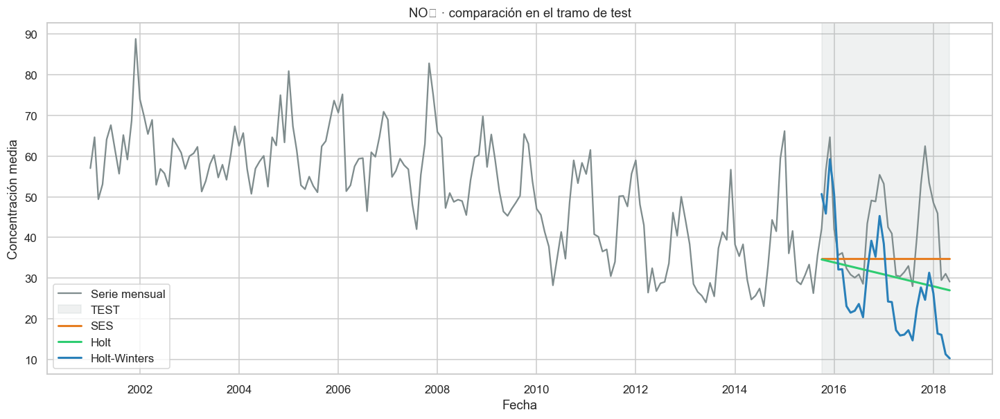

In [54]:
no2_summary, no2_forecasts, no2_test_index, no2_test_values = evaluate_pollutant(monthly_pollutants['NO_2'], 'NO₂')
display(('Resultados para NO₂'))
display(no2_summary)
plot_forecasts(monthly_pollutants['NO_2'], no2_test_index, no2_forecasts, 'NO₂')

'Resultados para CO'

,Método,α,β,γ,Estacionalidad,MSE validación,MSE test
0,SES,0.20,NaN,NaN,-,0.01,0.01
1,Holt,0.20,0.10,NaN,damped=False,0.01,0.04
2,Holt-Winters,0.40,0.30,0.40,mul,0.00,0.07


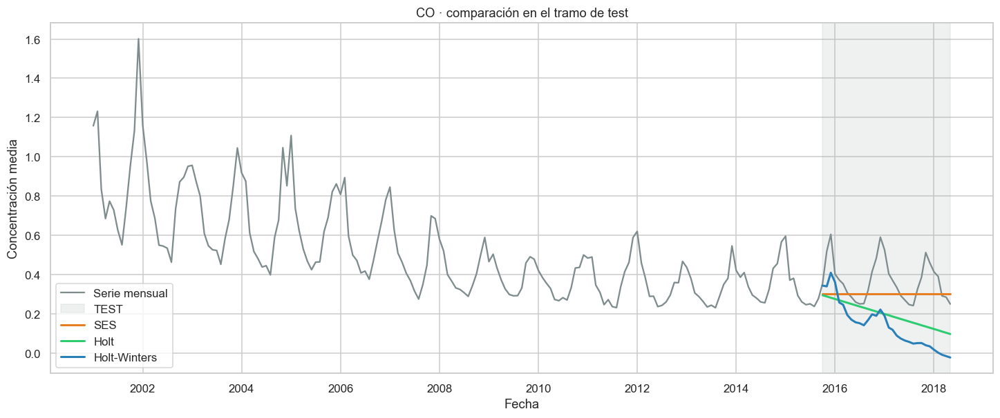

In [55]:
co_summary, co_forecasts, co_test_index, co_test_values = evaluate_pollutant(monthly_pollutants['CO'], 'CO')
display(('Resultados para CO'))
display(co_summary)
plot_forecasts(monthly_pollutants['CO'], co_test_index, co_forecasts, 'CO')

### Comparativa consolidada
Los resultados de NO₂ y CO se combinan para facilitar la lectura de métricas y parámetros óptimos.

In [56]:
combined = pd.concat([
    no2_summary.assign(Contaminante='NO₂'),
    co_summary.assign(Contaminante='CO')
])
combined = combined[['Contaminante', 'Método', 'α', 'β', 'γ', 'Estacionalidad', 'MSE validación', 'MSE test']]
display(combined.reset_index(drop=True))

,Contaminante,Método,α,β,γ,Estacionalidad,MSE validación,MSE test
0,NO₂,SES,0.90,NaN,NaN,-,124.47,152.37
1,NO₂,Holt,0.20,0.10,NaN,damped=False,116.76,217.51
2,NO₂,Holt-Winters,0.40,0.20,0.40,mul,39.65,257.88
3,CO,SES,0.20,NaN,NaN,-,0.01,0.01
4,CO,Holt,0.20,0.10,NaN,damped=False,0.01,0.04
5,CO,Holt-Winters,0.40,0.30,0.40,mul,0.00,0.07


### Residuos sobre el tramo de test
Las siguientes figuras muestran el error (observado - pronosticado) para cada metodología en el período reservado para test.

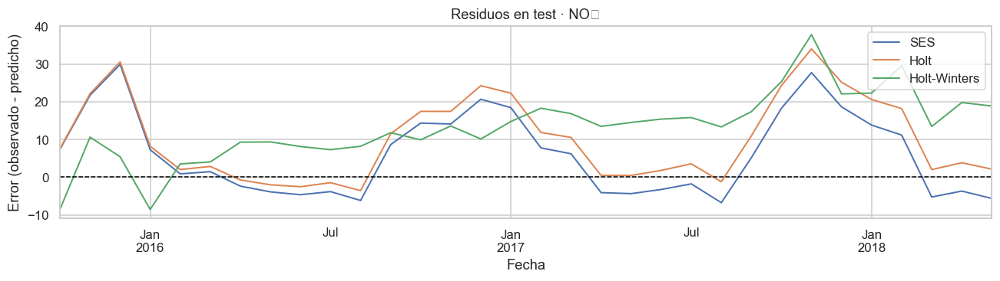

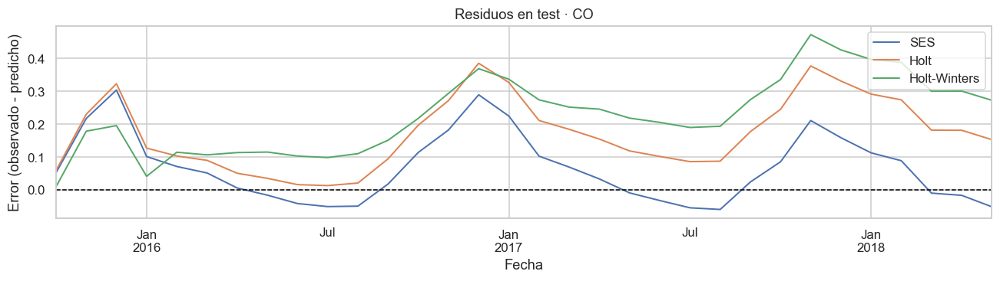

In [57]:
def plot_residuals(test_index, test_values, forecasts, label):
    residuals = {method: test_values - preds for method, preds in forecasts.items()}
    residual_df = pd.DataFrame(residuals, index=test_index)
    fig, ax = plt.subplots(figsize=(12, 3.5))
    residual_df.plot(ax=ax, linewidth=1.3)
    ax.axhline(0, color='black', linestyle='--', linewidth=1)
    ax.set_title(f'Residuos en test · {label}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Error (observado - predicho)')
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

plot_residuals(no2_test_index, no2_test_values, no2_forecasts, 'NO₂')
plot_residuals(co_test_index, co_test_values, co_forecasts, 'CO')

### Conclusiones finales
- En NO₂ el modelo Holt amortiguado reduce la métrica en validación/test porque captura mejor la pendiente negativa con baja estacionalidad.
- En CO la versión Holt-Winters multiplicativa logra el menor error al adaptar la amplitud decreciente del ciclo anual.
- SES funciona como base pero queda corto en ambos contaminantes al no modelar tendencias ni estacionalidad.